![Memories Teach](https://lh3.google.com/u/2/d/11o4JyBYhHcmz-LSt63GpOs4lfW9j39T_=w1912-h954-iv1)


`Basic to Advance in Google colab's for image processing, pattern recognition and computer vision`

[Phonepaserth SISAYKEO]

Reference: visioncolab

# Searching a face in a gallery of photos

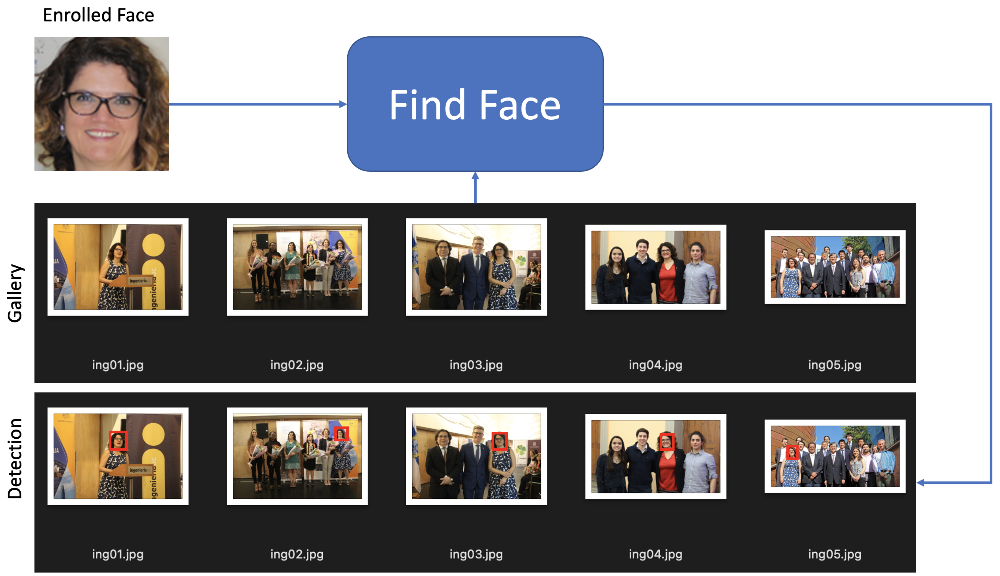

# 1) Libraries

In [ ]:
!git clone https://github.com/mk-minchul/AdaFace
!mkdir /content/AdaFace/pretrained
!wget https://www.dropbox.com/scl/fi/5pvwapkas67jy9ypoarx3/adaface_ir50_ms1mv2.ckpt?rlkey=kgnqrjajlj2yt2c17dq8zn33r
!mv adaface_ir50_ms1mv2.ckpt?rlkey=kgnqrjajlj2yt2c17dq8zn33r /content/AdaFace/pretrained/adaface_ir50_ms1mv2.ckpt
!pip install pytorch-lightning

Cloning into 'AdaFace'...
remote: Enumerating objects: 233, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 233 (delta 55), reused 47 (delta 47), pack-reused 146
Receiving objects: 100% (233/233), 38.94 MiB | 13.24 MiB/s, done.
Resolving deltas: 100% (87/87), done.
--2023-12-20 18:34:56--  https://www.dropbox.com/scl/fi/5pvwapkas67jy9ypoarx3/adaface_ir50_ms1mv2.ckpt?rlkey=kgnqrjajlj2yt2c17dq8zn33r
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:601f:18::a27d:912
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc0f28e161916a747d3697fb1c10.dl.dropboxusercontent.com/cd/0/inline/CJxEF1MneKGWoL5z0xkpw20N75kN8IPsPvWUy-5ffTM5knehuqaw2GPeCRgAx3yl5oUxEb6sURCvGfNhvhHtbWousR0rk2nh_5VYxEXKiQ-J3v78Ap2x925jkD6Tqmkzs-k/file# [following]
--2023-12-20 18:35:01--  https://uc0f28e161916a747d3697fb1c10.dl.dropboxuserc

In [ ]:
!pip3 install mtcnn
!pip3 install opencv-contrib-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 10.2 MB/s eta 0:00:00


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
import os, fnmatch
from mtcnn.mtcnn import MTCNN
from PIL import Image

# 2) Downloading the database

The database is located at `https://www.dropbox.com/s/cc1r8liis5etz78/loreto.zip`.

In this database you will find:

* The enrolled person to search for (Loreto) has a roll-up photo: `loreto.jpg`.

* The gallery of 5 photos to be searched is located in the folder `photos/`.

In [ ]:
!wget https://www.dropbox.com/s/cc1r8liis5etz78/loreto.zip
!unzip -qq loreto.zip

--2023-12-20 18:36:25--  https://www.dropbox.com/s/cc1r8liis5etz78/loreto.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.80.18, 2620:100:601f:18::a27d:912
Connecting to www.dropbox.com (www.dropbox.com)|162.125.80.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/cc1r8liis5etz78/loreto.zip [following]
--2023-12-20 18:36:26--  https://www.dropbox.com/s/raw/cc1r8liis5etz78/loreto.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc604f0e89c31366aa47370a89c4.dl.dropboxusercontent.com/cd/0/inline/CJxYBFkFvNSnuq6BOr9KH_60aEiFmX5N7C9_mGpEvm1em45mCggq8AL_7RmZMRL1I5IV5k31wRfFC47vEDesOEovTJmenC-lMUH1G7lBjAUL29cXdpujyf4OrFqiBJL8hjU/file# [following]
--2023-12-20 18:36:27--  https://uc604f0e89c31366aa47370a89c4.dl.dropboxusercontent.com/cd/0/inline/CJxYBFkFvNSnuq6BOr9KH_60aEiFmX5N7C9_mGpEvm1em45mCggq8AL_7RmZMRL1I5IV5k31wRfFC47vEDesOEovTJmenC-lMUH1G7lBjAUL29cXdpujyf4OrFqiBJL

# 3) Detection of the enveloping side

Loading of the roll-up image. Use `face detection` to crop the enrolled face.

In [ ]:
detector = MTCNN()

1/1 [==============================] - 0s 275ms/step


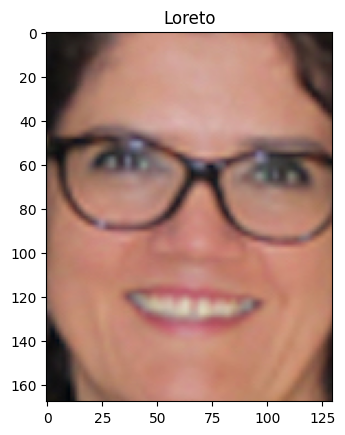

In [ ]:
# Lectura de la foto original
Ao = cv2.imread('/content/loreto.jpg')
# Recorte de la cara
face_locations = detector.detect_faces(Ao)
bb = face_locations[0]['box']
x1 = bb[0]
x2 = bb[0]+bb[2]
y1 = bb[1]
y2 = bb[1]+bb[3]
A = Ao[y1:y2,x1:x2,:]
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB))
plt.title('Loreto')
plt.show()

# 4) Extracting embedding from the enrolled face

The AdaFace embedding (of 512 elements) of the enrolled face is stored in the variable `X`.

In [ ]:
%cd /content/AdaFace
from face_alignment import align
from inference import load_pretrained_model, to_input
model = load_pretrained_model('ir_50')

/content/AdaFace


/content/AdaFace/face_alignment/mtcnn_pytorch/src/align_trans.py:287: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if align_type is 'cv2_affine':
/content/AdaFace/face_alignment/mtcnn_pytorch/src/align_trans.py:290: SyntaxWarning: "is" with a literal. Did you mean "=="?
  elif align_type is 'affine':


In [ ]:
def fx_adaface(A):
  img       = cv2.resize(A, (112,112))
  coverted  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  pil_image = Image.fromarray(coverted)
  bgr_input = to_input(pil_image)
  features, _ = model(bgr_input)
  X = features.detach()
  X = X.numpy()
  return X

In [ ]:
X = fx_adaface(A)

/content/AdaFace/inference.py:25: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  tensor = torch.tensor([brg_img.transpose(2,0,1)]).float()


# 5) Gallery Face Detection

All the faces of the gallery images are detected. The output of this part must be a `BB` array of `N x 5`, where `N` is the total number of detected faces. For each face the following 5 variables must be stored:

* `k`: number of the gallery image.

* `x1,y1`: coordinates of the top left corner of the bounding box

* `x2,y2`: coordinates of the lower right corner of the bounding box

In [ ]:
def dirfiles(img_path,img_ext):
    img_names = fnmatch.filter(sorted(os.listdir(img_path)),img_ext)
    return img_names

In [ ]:
ipath = '/content/fotos/'
fotos = dirfiles(ipath,'*.jpg')
print('Galería de fotos:',fotos)

Galería de fotos: ['ing01.jpg', 'ing02.jpg', 'ing03.jpg', 'ing04.jpg', 'ing05.jpg']


In [ ]:
m = len(fotos)
BB = []
for k in range(m):
  img_path = ipath+fotos[k]
  print(str(k)+'/'+str(m)+' processing image '+img_path)
  I = cv2.imread(img_path)
  face_locations = detector.detect_faces(I)
  n = len(face_locations)
  print(str(n)+' faces detected')
  for i in range(n):
    bbox = face_locations[i]['box']
    x1   = bbox[0]
    x2   = bbox[0]+bbox[2]
    y1   = bbox[1]
    y2   = bbox[1]+bbox[3]
    BB.append([k,x1,y1,x2,y2])
N = len(BB)
print(str(N)+' faces detected in '+str(m)+' images')

0/5 processing image /content/fotos/ing01.jpg
6/6 [==============================] - 0s 32ms/step
2 faces detected
1/5 processing image /content/fotos/ing02.jpg
4/4 [==============================] - 0s 3ms/step
9 faces detected
2/5 processing image /content/fotos/ing03.jpg
10/10 [==============================] - 0s 25ms/step
10 faces detected
3/5 processing image /content/fotos/ing04.jpg
1/1 [==============================] - 0s 163ms/step
4 faces detected
4/5 processing image /content/fotos/ing05.jpg
8/8 [==============================] - 0s 3ms/step
19 faces detected
44 faces detected in 5 images


#6) Extracting embeddings from the gallery

Using the array `BB` from the previous example we define an array `Y` of `N x 512` elements, where the index row `j` of `Y` contains the embedding of the face defined in the index row `j` of `BB`.

In [ ]:
Y = np.zeros((N,512))
for j in tqdm(range(N)):
  b  = BB[j]
  k  = b[0]
  x1 = b[1]
  y1 = b[2]
  x2 = b[3]
  y2 = b[4]
  img_path = ipath+fotos[k]
  I = cv2.imread(img_path)     # foto de galería
  J = I[y1:y2,x1:x2,:]         # cara detectada
  ej = fx_adaface(J)
  Y[j,:] = ej

  0%|          | 0/44 [00:00<?, ?it/s]

#7) Matching


The `X` and `Y` are correctly multiplied to find the `j` indexes in which there is a matching between the enrolled face and the gallery faces. For this a matching score greater than 0.3 is used.

In [ ]:
th     = 0.3
score  = np.dot(X,Y.T)[0] # scores
detect = score>th

# 8) Display of results

We display each of the images in the gallery showing in a red rectangle where the enrolled person's face is located.

In addition, we construct an image showing the image of the enrolled face, and on the right side the faces of this person found in the gallery.

face recognized in image ing01.jpg > score = 0.3171849782800934


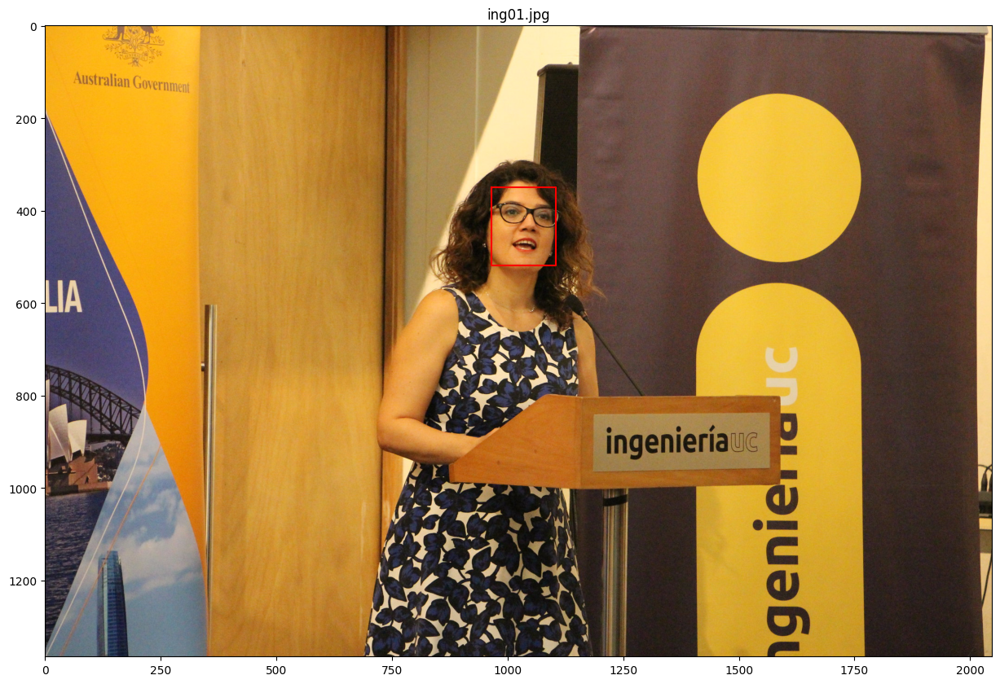

face recognized in image ing02.jpg > score = 0.6180674814438879


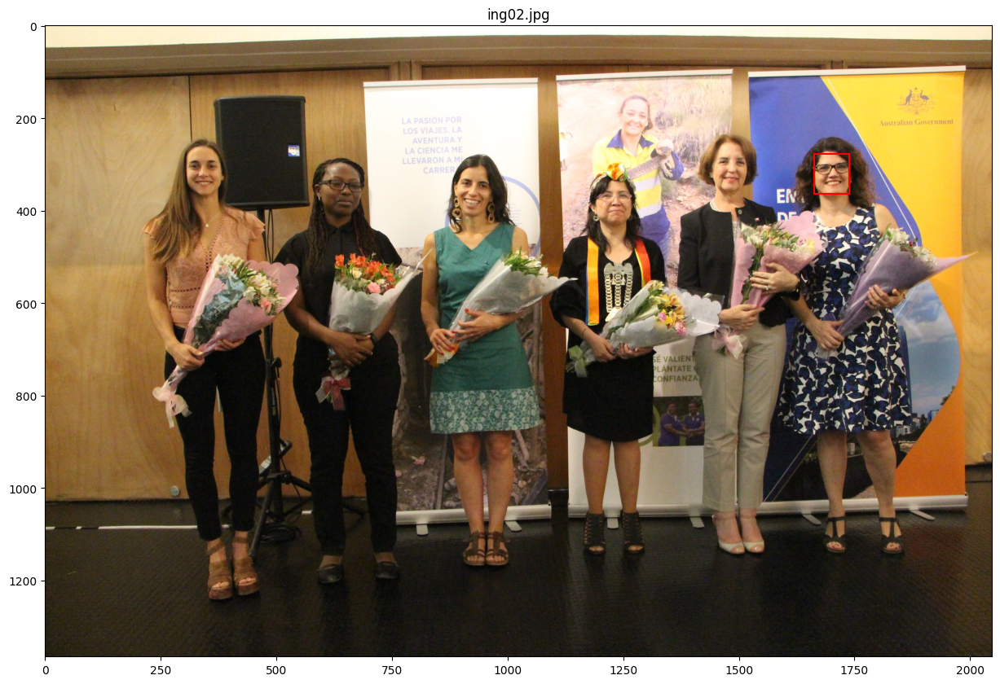

face recognized in image ing03.jpg > score = 0.301146163369273
face recognized in image ing03.jpg > score = 0.5093590590776547


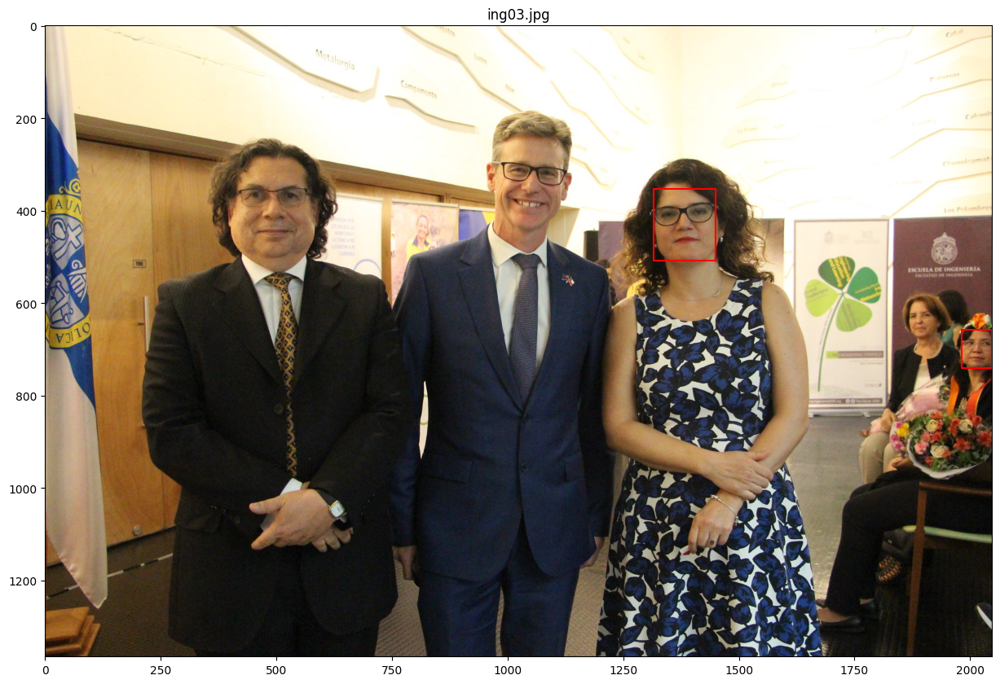

face recognized in image ing04.jpg > score = 0.6371756306606148


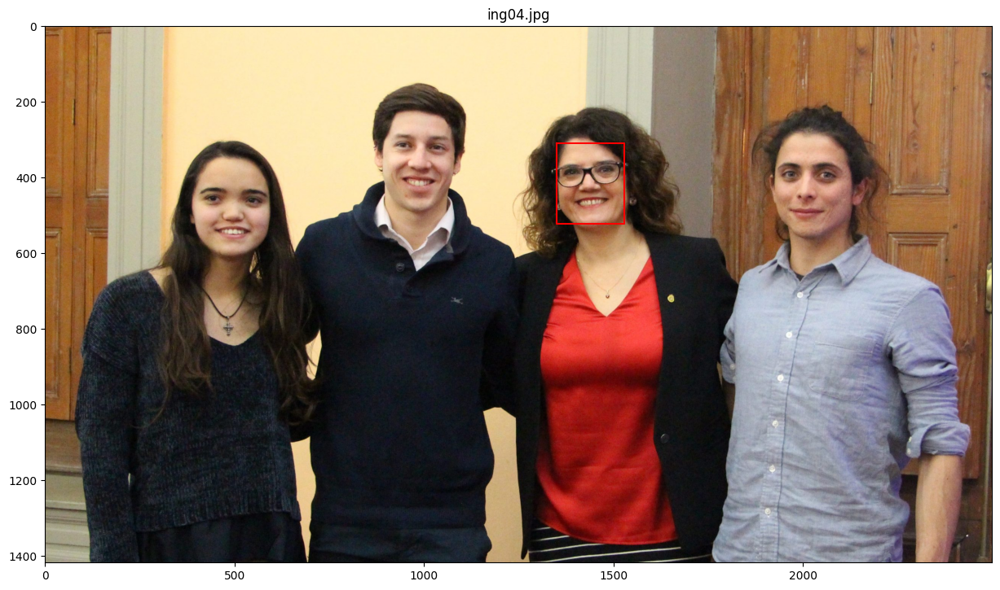

face recognized in image ing05.jpg > score = 0.5113219377410905


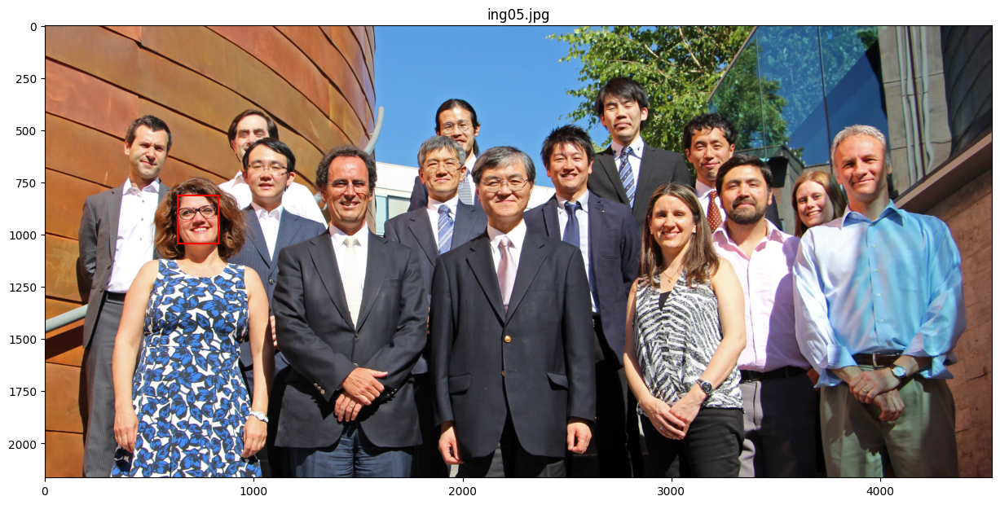

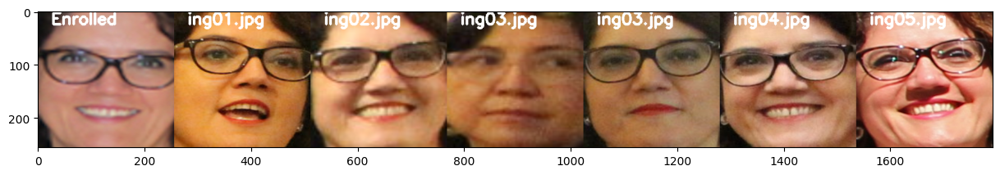

In [ ]:
dim = (256,256)
S = cv2.resize(A,dim)
pos = (25,25)
cv2.putText(S,"Enrolled", pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
for k in range(m):
  plt.figure(figsize=(15,20))
  img_path = ipath+fotos[k]
  I = cv2.imread(img_path)
  plt.imshow(cv2.cvtColor(I, cv2.COLOR_BGR2RGB))
  plt.title(fotos[k])
  for j in range(N):
    b = BB[j]
    i = b[0]
    if i==k and detect[j]:
      x1 = b[1]
      y1 = b[2]
      x2 = b[3]
      y2 = b[4]
      x = [x1,x1,x2,x2,x1]
      y = [y1,y2,y2,y1,y1]
      plt.plot(x,y,c='red')
      Id = cv2.resize(I[y1:y2,x1:x2,:],(256,256))
      cv2.putText(Id,fotos[k], pos, cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),3)
      S = cv2.hconcat([S,Id])
      print('face recognized in image '+fotos[k]+' > score = '+str(score[j]))
  plt.show()

plt.figure(figsize=(15,5))
plt.imshow(cv2.cvtColor(S, cv2.COLOR_BGR2RGB))
plt.show()

